In [1]:
# imports
import pandas as pd
from keras import models
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.preprocessing import LabelEncoder
import dalex as dx

from matplotlib.pyplot import *

2022-11-27 18:34:16.276118: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
# read in test set
test_df = pd.read_csv('/Users/taylor/Desktop/DS340W/term_project/data/wisconsin/wisconsin_test.csv')
test_dataset = test_df.values

test_X = test_dataset[:,0:30].astype(float)
test_Y = test_dataset[:,30]

# encode class values as integers
encoder = LabelEncoder()

encoder.fit(test_Y)
encoded_test_Y = encoder.transform(test_Y)

In [3]:
# Reconstruct models
baseNet = models.load_model('/Users/taylor/Desktop/DS340W/term_project/models/baseNet')
smallNet = models.load_model('/Users/taylor/Desktop/DS340W/term_project/models/smallNet')
bigNet5 = models.load_model('/Users/taylor/Desktop/DS340W/term_project/models/bigNet5')
bigNet7 = models.load_model('/Users/taylor/Desktop/DS340W/term_project/models/bigNet7')
bigNet10 = models.load_model('/Users/taylor/Desktop/DS340W/term_project/models/bigNet10')
bigNet15 = models.load_model('/Users/taylor/Desktop/DS340W/term_project/models/bigNet15')

2022-11-27 18:34:28.036695: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [4]:
# construct Dalex explainers
baseExp = dx.Explainer(baseNet, test_X, encoded_test_Y, label = "diagnosis")
smallExp = dx.Explainer(smallNet, test_X, encoded_test_Y, label = "diagnosis")
big5Exp = dx.Explainer(bigNet5, test_X, encoded_test_Y, label = "diagnosis")
big7Exp = dx.Explainer(bigNet7, test_X, encoded_test_Y, label = "diagnosis")
big10Exp = dx.Explainer(bigNet10, test_X, encoded_test_Y, label = "diagnosis")
big15Exp = dx.Explainer(bigNet15, test_X, encoded_test_Y, label = "diagnosis")

Preparation of a new explainer is initiated

  -> data              : numpy.ndarray converted to pandas.DataFrame. Columns are set as string numbers.
  -> data              : 171 rows 30 cols
  -> target variable   : 171 values
  -> model_class       : keras.engine.sequential.Sequential (default)
  -> label             : diagnosis
  -> predict function  : <function yhat_tf_regression at 0x7fdf2885bd30> will be used (default)
1/1 [==============================] - 1s 739ms/step
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
6/6 [==============================] - 0s 2ms/step
  -> predicted values  : min = 8.44e-08, mean = 0.379, max = 1.0
  -> model type        : regression will be used (default)
  -> residual function : difference between y and yhat (default)
6/6 [==============================] - 0s 3ms/step
  -> residuals         : min = -0.889, mean = -0.0101, max = 0.816
  -> model_info        : package keras

A new explainer has been created!
Preparation of a 

In [5]:
# Get model-level explanations for each explainer:

In [13]:
    # Explore feature performance:

In [23]:
baseExp.model_parts(loss_function = 'auc').plot()

6/6 [==============================] - 0s 1ms/step


6/6 [==============================] - 0s 1ms/step


In [24]:
smallExp.model_parts(loss_function = 'auc').plot()

6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


In [25]:
big5Exp.model_parts(loss_function = 'auc').plot()

6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


In [26]:
big7Exp.model_parts(loss_function = 'auc').plot()

6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


In [27]:
big10Exp.model_parts(loss_function = 'auc').plot()

6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 4ms/step


In [28]:
big15Exp.model_parts(loss_function = 'auc').plot()

6/6 [==============================] - 0s 3ms/step


6/6 [==============================] - 0s 2ms/step


In [29]:
# What are the continuous relationships between variables and predictions?

In [37]:
baseExp.model_profile(type = 'partial').plot(variables=['6', '7', '13', '10','28','21', '26', '11', '15', '20'])

Calculating ceteris paribus:   0%|                       | 0/30 [00:00<?, ?it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:   3%|▌              | 1/30 [00:00<00:26,  1.10it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:   7%|█              | 2/30 [00:01<00:25,  1.11it/s]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  10%|█▌             | 3/30 [00:02<00:26,  1.00it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  13%|██             | 4/30 [00:03<00:26,  1.02s/it]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  17%|██▌            | 5/30 [00:04<00:24,  1.04it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  20%|███            | 6/30 [00:05<00:22,  1.08it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  23%|███▌           | 7/30 [00:06<00:20,  1.11it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  27%|████           | 8/30 [00:07<00:19,  1.13it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  30%|████▌          | 9/30 [00:08<00:18,  1.13it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  33%|████▋         | 10/30 [00:09<00:17,  1.15it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  37%|█████▏        | 11/30 [00:10<00:17,  1.10it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  40%|█████▌        | 12/30 [00:11<00:16,  1.08it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  43%|██████        | 13/30 [00:11<00:15,  1.11it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  47%|██████▌       | 14/30 [00:12<00:14,  1.13it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  50%|███████       | 15/30 [00:13<00:13,  1.14it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  53%|███████▍      | 16/30 [00:14<00:12,  1.15it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  57%|███████▉      | 17/30 [00:15<00:12,  1.01it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  60%|████████▍     | 18/30 [00:16<00:12,  1.06s/it]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  63%|████████▊     | 19/30 [00:17<00:11,  1.04s/it]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  67%|█████████▎    | 20/30 [00:18<00:09,  1.01it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  70%|█████████▊    | 21/30 [00:19<00:09,  1.00s/it]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  73%|██████████▎   | 22/30 [00:20<00:07,  1.04it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  77%|██████████▋   | 23/30 [00:21<00:06,  1.04it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  80%|███████████▏  | 24/30 [00:22<00:05,  1.06it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  83%|███████████▋  | 25/30 [00:23<00:04,  1.07it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  87%|████████████▏ | 26/30 [00:24<00:03,  1.09it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  90%|████████████▌ | 27/30 [00:25<00:02,  1.10it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  93%|█████████████ | 28/30 [00:26<00:01,  1.10it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  97%|█████████████▌| 29/30 [00:27<00:00,  1.12it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus: 100%|██████████████| 30/30 [00:27<00:00,  1.08it/s]


6/6 [==============================] - 0s 2ms/step


In [34]:
smallExp.model_profile().plot(variables=['6', '7', '13', '10','9','23', '21', '26', '15', '20'])

Calculating ceteris paribus:   0%|                       | 0/30 [00:00<?, ?it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:   3%|▌              | 1/30 [00:00<00:27,  1.04it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:   7%|█              | 2/30 [00:02<00:29,  1.07s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  10%|█▌             | 3/30 [00:03<00:30,  1.13s/it]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  13%|██             | 4/30 [00:04<00:26,  1.00s/it]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  17%|██▌            | 5/30 [00:05<00:25,  1.01s/it]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  20%|███            | 6/30 [00:05<00:22,  1.07it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  23%|███▌           | 7/30 [00:06<00:21,  1.08it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  27%|████           | 8/30 [00:07<00:20,  1.07it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  30%|████▌          | 9/30 [00:08<00:18,  1.12it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  33%|████▋         | 10/30 [00:09<00:17,  1.14it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  37%|█████▏        | 11/30 [00:10<00:16,  1.16it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  40%|█████▌        | 12/30 [00:11<00:15,  1.15it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  43%|██████        | 13/30 [00:12<00:15,  1.13it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  47%|██████▌       | 14/30 [00:12<00:13,  1.14it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  50%|███████       | 15/30 [00:13<00:13,  1.11it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  53%|███████▍      | 16/30 [00:14<00:12,  1.08it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  57%|███████▉      | 17/30 [00:15<00:11,  1.11it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  60%|████████▍     | 18/30 [00:16<00:11,  1.07it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  63%|████████▊     | 19/30 [00:17<00:10,  1.09it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  67%|█████████▎    | 20/30 [00:18<00:08,  1.12it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  70%|█████████▊    | 21/30 [00:19<00:07,  1.15it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  73%|██████████▎   | 22/30 [00:20<00:07,  1.11it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  77%|██████████▋   | 23/30 [00:21<00:06,  1.06it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  80%|███████████▏  | 24/30 [00:22<00:05,  1.04it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  83%|███████████▋  | 25/30 [00:23<00:04,  1.04it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  87%|████████████▏ | 26/30 [00:24<00:03,  1.05it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  90%|████████████▌ | 27/30 [00:25<00:02,  1.08it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  93%|█████████████ | 28/30 [00:25<00:01,  1.07it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  97%|█████████████▌| 29/30 [00:26<00:00,  1.07it/s]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus: 100%|██████████████| 30/30 [00:27<00:00,  1.08it/s]


6/6 [==============================] - 0s 2ms/step


In [22]:
big5Exp.model_profile().plot(variables=['13', '7', '6', '21','28','10', '4', '19', '15', '23'])

Calculating ceteris paribus:   0%|                       | 0/30 [00:00<?, ?it/s]

540/540 [==============================] - 2s 4ms/step


Calculating ceteris paribus:   3%|▌              | 1/30 [00:03<01:28,  3.05s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:   7%|█              | 2/30 [00:04<00:58,  2.07s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  10%|█▌             | 3/30 [00:07<01:03,  2.34s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  13%|██             | 4/30 [00:08<00:51,  1.99s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  17%|██▌            | 5/30 [00:09<00:41,  1.67s/it]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  20%|███            | 6/30 [00:10<00:35,  1.47s/it]

540/540 [==============================] - 1s 3ms/step


Calculating ceteris paribus:  23%|███▌           | 7/30 [00:12<00:36,  1.57s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  27%|████           | 8/30 [00:14<00:35,  1.61s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  30%|████▌          | 9/30 [00:15<00:31,  1.48s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  33%|████▋         | 10/30 [00:17<00:30,  1.54s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  37%|█████▏        | 11/30 [00:18<00:30,  1.58s/it]

540/540 [==============================] - 2s 4ms/step


Calculating ceteris paribus:  40%|█████▌        | 12/30 [00:21<00:33,  1.88s/it]

540/540 [==============================] - 2s 3ms/step


Calculating ceteris paribus:  43%|██████        | 13/30 [00:23<00:32,  1.93s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  47%|██████▌       | 14/30 [00:24<00:28,  1.78s/it]

540/540 [==============================] - 2s 4ms/step


Calculating ceteris paribus:  50%|███████       | 15/30 [00:27<00:29,  1.95s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  53%|███████▍      | 16/30 [00:28<00:26,  1.88s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  57%|███████▉      | 17/30 [00:30<00:23,  1.78s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  60%|████████▍     | 18/30 [00:31<00:20,  1.69s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  63%|████████▊     | 19/30 [00:33<00:17,  1.55s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  67%|█████████▎    | 20/30 [00:34<00:14,  1.46s/it]

540/540 [==============================] - 2s 3ms/step


Calculating ceteris paribus:  70%|█████████▊    | 21/30 [00:36<00:14,  1.62s/it]

540/540 [==============================] - 2s 3ms/step


Calculating ceteris paribus:  73%|██████████▎   | 22/30 [00:38<00:13,  1.73s/it]

540/540 [==============================] - 2s 3ms/step


Calculating ceteris paribus:  77%|██████████▋   | 23/30 [00:40<00:13,  1.86s/it]

540/540 [==============================] - 2s 3ms/step


Calculating ceteris paribus:  80%|███████████▏  | 24/30 [00:43<00:12,  2.11s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  83%|███████████▋  | 25/30 [00:44<00:09,  1.86s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  87%|████████████▏ | 26/30 [00:45<00:06,  1.67s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  90%|████████████▌ | 27/30 [00:46<00:04,  1.55s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  93%|█████████████ | 28/30 [00:48<00:02,  1.47s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  97%|█████████████▌| 29/30 [00:49<00:01,  1.40s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus: 100%|██████████████| 30/30 [00:50<00:00,  1.70s/it]


6/6 [==============================] - 0s 2ms/step


In [23]:
big7Exp.model_profile().plot(variables=['7', '10', '6', '13','15','20', '19', '21', '26', '23'])

Calculating ceteris paribus:   0%|                       | 0/30 [00:00<?, ?it/s]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:   3%|▌              | 1/30 [00:01<00:36,  1.27s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:   7%|█              | 2/30 [00:02<00:33,  1.20s/it]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  10%|█▌             | 3/30 [00:03<00:30,  1.12s/it]

540/540 [==============================] - 1s 3ms/step


Calculating ceteris paribus:  13%|██             | 4/30 [00:05<00:38,  1.47s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  17%|██▌            | 5/30 [00:06<00:35,  1.43s/it]

540/540 [==============================] - 2s 3ms/step


Calculating ceteris paribus:  20%|███            | 6/30 [00:08<00:37,  1.55s/it]

540/540 [==============================] - 2s 3ms/step


Calculating ceteris paribus:  23%|███▌           | 7/30 [00:11<00:42,  1.84s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  27%|████           | 8/30 [00:12<00:37,  1.71s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  30%|████▌          | 9/30 [00:13<00:32,  1.54s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  33%|████▋         | 10/30 [00:14<00:28,  1.43s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  37%|█████▏        | 11/30 [00:16<00:28,  1.48s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  40%|█████▌        | 12/30 [00:18<00:27,  1.55s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  43%|██████        | 13/30 [00:19<00:25,  1.51s/it]

540/540 [==============================] - 3s 5ms/step


Calculating ceteris paribus:  47%|██████▌       | 14/30 [00:22<00:31,  1.95s/it]

540/540 [==============================] - 2s 3ms/step


Calculating ceteris paribus:  50%|███████       | 15/30 [00:25<00:32,  2.17s/it]

540/540 [==============================] - 2s 3ms/step


Calculating ceteris paribus:  53%|███████▍      | 16/30 [00:27<00:29,  2.09s/it]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  57%|███████▉      | 17/30 [00:28<00:23,  1.79s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  60%|████████▍     | 18/30 [00:29<00:20,  1.71s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  63%|████████▊     | 19/30 [00:31<00:17,  1.62s/it]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  67%|█████████▎    | 20/30 [00:32<00:14,  1.44s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  70%|█████████▊    | 21/30 [00:33<00:12,  1.44s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  73%|██████████▎   | 22/30 [00:36<00:14,  1.80s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  77%|██████████▋   | 23/30 [00:37<00:11,  1.61s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  80%|███████████▏  | 24/30 [00:38<00:09,  1.60s/it]

540/540 [==============================] - 2s 4ms/step


Calculating ceteris paribus:  83%|███████████▋  | 25/30 [00:42<00:10,  2.11s/it]

540/540 [==============================] - 2s 3ms/step


Calculating ceteris paribus:  87%|████████████▏ | 26/30 [00:44<00:08,  2.09s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  90%|████████████▌ | 27/30 [00:46<00:06,  2.03s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  93%|█████████████ | 28/30 [00:47<00:03,  1.84s/it]

540/540 [==============================] - 2s 3ms/step


Calculating ceteris paribus:  97%|█████████████▌| 29/30 [00:49<00:02,  2.01s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus: 100%|██████████████| 30/30 [00:51<00:00,  1.73s/it]


6/6 [==============================] - 0s 2ms/step


In [24]:
big10Exp.model_profile().plot(variables=['13', '27', '10', '26','7','23', '21', '22', '20', '25'])

Calculating ceteris paribus:   0%|                       | 0/30 [00:00<?, ?it/s]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:   3%|▌              | 1/30 [00:01<00:40,  1.38s/it]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:   7%|█              | 2/30 [00:02<00:32,  1.17s/it]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  10%|█▌             | 3/30 [00:03<00:29,  1.10s/it]

540/540 [==============================] - 2s 3ms/step


Calculating ceteris paribus:  13%|██             | 4/30 [00:05<00:42,  1.65s/it]

540/540 [==============================] - 2s 3ms/step


Calculating ceteris paribus:  17%|██▌            | 5/30 [00:08<00:46,  1.86s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  20%|███            | 6/30 [00:09<00:41,  1.73s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  23%|███▌           | 7/30 [00:10<00:35,  1.56s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  27%|████           | 8/30 [00:12<00:33,  1.54s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  30%|████▌          | 9/30 [00:16<00:48,  2.30s/it]

540/540 [==============================] - 2s 3ms/step


Calculating ceteris paribus:  33%|████▋         | 10/30 [00:18<00:45,  2.25s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  37%|█████▏        | 11/30 [00:19<00:37,  1.96s/it]

540/540 [==============================] - 2s 3ms/step


Calculating ceteris paribus:  40%|█████▌        | 12/30 [00:21<00:36,  2.03s/it]

540/540 [==============================] - 3s 6ms/step


Calculating ceteris paribus:  43%|██████        | 13/30 [00:25<00:42,  2.52s/it]

540/540 [==============================] - 1s 3ms/step


Calculating ceteris paribus:  47%|██████▌       | 14/30 [00:27<00:38,  2.38s/it]

540/540 [==============================] - 1s 3ms/step


Calculating ceteris paribus:  50%|███████       | 15/30 [00:29<00:33,  2.22s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  53%|███████▍      | 16/30 [00:30<00:26,  1.92s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  57%|███████▉      | 17/30 [00:31<00:22,  1.72s/it]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  60%|████████▍     | 18/30 [00:33<00:18,  1.54s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  63%|████████▊     | 19/30 [00:34<00:16,  1.52s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  67%|█████████▎    | 20/30 [00:35<00:14,  1.44s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  70%|█████████▊    | 21/30 [00:37<00:12,  1.40s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  73%|██████████▎   | 22/30 [00:38<00:10,  1.33s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  77%|██████████▋   | 23/30 [00:39<00:09,  1.42s/it]

540/540 [==============================] - 2s 3ms/step


Calculating ceteris paribus:  80%|███████████▏  | 24/30 [00:41<00:09,  1.60s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  83%|███████████▋  | 25/30 [00:43<00:07,  1.59s/it]

540/540 [==============================] - 1s 3ms/step


Calculating ceteris paribus:  87%|████████████▏ | 26/30 [00:45<00:06,  1.67s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  90%|████████████▌ | 27/30 [00:46<00:04,  1.51s/it]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  93%|█████████████ | 28/30 [00:47<00:02,  1.38s/it]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  97%|█████████████▌| 29/30 [00:48<00:01,  1.29s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus: 100%|██████████████| 30/30 [00:49<00:00,  1.66s/it]


6/6 [==============================] - 0s 2ms/step


In [25]:
big15Exp.model_profile().plot(variables=['23', '22', '10', '13','28','7', '27', '26', '21', '19'])

Calculating ceteris paribus:   0%|                       | 0/30 [00:00<?, ?it/s]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:   3%|▌              | 1/30 [00:01<00:39,  1.36s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:   7%|█              | 2/30 [00:02<00:42,  1.52s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  10%|█▌             | 3/30 [00:04<00:40,  1.49s/it]

540/540 [==============================] - 2s 4ms/step


Calculating ceteris paribus:  13%|██             | 4/30 [00:07<00:50,  1.95s/it]

540/540 [==============================] - 2s 3ms/step


Calculating ceteris paribus:  17%|██▌            | 5/30 [00:09<00:50,  2.02s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  20%|███            | 6/30 [00:10<00:43,  1.83s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  23%|███▌           | 7/30 [00:11<00:37,  1.63s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  27%|████           | 8/30 [00:12<00:31,  1.45s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  30%|████▌          | 9/30 [00:14<00:28,  1.35s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  33%|████▋         | 10/30 [00:15<00:25,  1.27s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  37%|█████▏        | 11/30 [00:16<00:23,  1.21s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  40%|█████▌        | 12/30 [00:17<00:21,  1.18s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  43%|██████        | 13/30 [00:18<00:19,  1.16s/it]

540/540 [==============================] - 1s 1ms/step


Calculating ceteris paribus:  47%|██████▌       | 14/30 [00:19<00:18,  1.13s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  50%|███████       | 15/30 [00:20<00:16,  1.12s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  53%|███████▍      | 16/30 [00:22<00:16,  1.19s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  57%|███████▉      | 17/30 [00:23<00:15,  1.23s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  60%|████████▍     | 18/30 [00:24<00:14,  1.20s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  63%|████████▊     | 19/30 [00:25<00:12,  1.18s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  67%|█████████▎    | 20/30 [00:26<00:12,  1.22s/it]

540/540 [==============================] - 1s 3ms/step


Calculating ceteris paribus:  70%|█████████▊    | 21/30 [00:28<00:12,  1.40s/it]

540/540 [==============================] - 2s 4ms/step


Calculating ceteris paribus:  73%|██████████▎   | 22/30 [00:31<00:13,  1.74s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  77%|██████████▋   | 23/30 [00:32<00:11,  1.60s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  80%|███████████▏  | 24/30 [00:34<00:09,  1.57s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  83%|███████████▋  | 25/30 [00:35<00:07,  1.43s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  87%|████████████▏ | 26/30 [00:36<00:05,  1.34s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  90%|████████████▌ | 27/30 [00:37<00:03,  1.27s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  93%|█████████████ | 28/30 [00:38<00:02,  1.23s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus:  97%|█████████████▌| 29/30 [00:39<00:01,  1.19s/it]

540/540 [==============================] - 1s 2ms/step


Calculating ceteris paribus: 100%|██████████████| 30/30 [00:40<00:00,  1.36s/it]


6/6 [==============================] - 0s 3ms/step


In [26]:
# residual diagnostics for most significant feature of each model: 6, 7, 13, 23

In [27]:
# '6' = concavity_mean
baseExp.model_diagnostics().plot(variable='6', yvariable="abs_residuals", marker_size=5, line_width=3)

In [28]:
baseDiagnostics = baseExp.model_diagnostics().result
baseDiagnostics.to_csv('baseDiagnosticsTable.csv', index=False)

In [29]:
# '6' = concavity_mean
smallExp.model_diagnostics().plot(variable='6', yvariable="abs_residuals", marker_size=5, line_width=3)

In [30]:
smallDiagnostics = smallExp.model_diagnostics().result
smallDiagnostics.to_csv('smallDiagnosticsTable.csv', index=False)

In [31]:
# '13' = area_se
big5Exp.model_diagnostics().plot(variable='13', yvariable="abs_residuals", marker_size=5, line_width=3)

In [32]:
big5Diagnostics = big5Exp.model_diagnostics().result
big5Diagnostics.to_csv('big5DiagnosticsTable.csv', index=False)

In [33]:
# '7' = concave.points_mean
big7Exp.model_diagnostics().plot(variable='7', yvariable="abs_residuals", marker_size=5, line_width=3)

In [34]:
big7Diagnostics = big7Exp.model_diagnostics().result
big7Diagnostics.to_csv('big7DiagnosticsTable.csv', index=False)

In [35]:
# '13' = area_se
big10Exp.model_diagnostics().plot(variable='13', yvariable="abs_residuals", marker_size=5, line_width=3)

In [36]:
big10Diagnostics = big10Exp.model_diagnostics().result
big10Diagnostics.to_csv('big10DiagnosticsTable.csv', index=False)

In [37]:
# '23' = area_worst
big15Exp.model_diagnostics().plot(variable='23', yvariable="abs_residuals", marker_size=5, line_width=3)

In [38]:
big15Diagnostics = big15Exp.model_diagnostics().result
big15Diagnostics.to_csv('big15DiagnosticsTable.csv', index=False)

In [39]:
# prediction level explanations ~ SHAPley values

In [40]:
X = pd.DataFrame({'radius_mean': [.372],
                  'texture_mean': [.1327],
                  'perimeter_mean': [.2988],
                  'area_mean': [.2742],
                  'smoothness_mean': [.4041],
                  'compactness_mean': [.2756],
                  'concavity_mean': [0.2443],
                  'concave.points_mean': [0.3738],
                  'symmetry_mean': [0.3982],
                  'fractal_dimension_mean': [0.1856],
                  'radius_se': [0.0104],
                  'texture_se': [0.0595],
                  'perimeter_se': [0.0041],
                  'area_se': [0.01913],
                 'smoothness_se': [0.1497],
                 'compactness_se': [0.1762],
                 'concavity_se': [0.1521],
                 'concave.points_se': [0.3197],
                 'symmetry_se': [0.1204],
                 'fractal_dimension_se': [0.0632],
                 'radius_worst': [0.2948],
                 'texture_worst': [0.2399],
                 'perimeter_worst': [0.2608],
                 'area_worst': [0.1774],
                 'smoothness_worst': [0.5126],
                 'compactness_worst': [0.3191],
                 'concavity_worst': [0.4081],
                 'concave.points_worst': [0.7192],
                 'symmetry_worst': [0.3966],
                 'fractal_dimension_worst': [0.1647]},
                 index = ['X'])

#X, y = test_df.drop('diagnosis', axis=1), test_df.diagnosis
baseExp.predict_parts(X, type='shap').plot()

6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


In [41]:
smallExp.predict_parts(X, type='shap').plot()

6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 1ms/step


6/6 [==============================] - 0s 2ms/step


In [42]:
big5Exp.predict_parts(X, type='shap').plot()

6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


In [43]:
big7Exp.predict_parts(X, type='shap').plot()

6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 3ms/step


6/6 [==============================] - 0s 3ms/step


In [44]:
big10Exp.predict_parts(X, type='shap').plot()

6/6 [==============================] - 0s 3ms/step


6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 3ms/step


In [45]:
big15Exp.predict_parts(X, type='shap').plot()

6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


In [46]:
# LIME explanations
baseNN_pparts = baseExp.predict_surrogate(new_observation = X)
smallNN_pparts = smallExp.predict_surrogate(new_observation = X)
big5NN_pparts = big5Exp.predict_surrogate(new_observation = X)
big7NN_pparts = big7Exp.predict_surrogate(new_observation = X)
big10NN_pparts = big10Exp.predict_surrogate(new_observation = X)
big15NN_pparts = big15Exp.predict_surrogate(new_observation = X)

157/157 [==============================] - 0s 2ms/step


In [47]:
# plotted explanations
baseNN_pparts.show_in_notebook()

In [48]:
smallNN_pparts.show_in_notebook()

In [49]:
big5NN_pparts.show_in_notebook()

In [50]:
big7NN_pparts.show_in_notebook()

In [51]:
big10NN_pparts.show_in_notebook()

In [52]:
big15NN_pparts.show_in_notebook()

In [53]:
# breakdown plots

In [54]:
# breakdown explanations
baseNN_pparts = baseExp.predict_parts(new_observation = X, type = "break_down")
smallNN_pparts = smallExp.predict_parts(new_observation = X, type = "break_down")
big5NN_pparts = big5Exp.predict_parts(new_observation = X, type = "break_down")
big7NN_pparts = big7Exp.predict_parts(new_observation = X, type = "break_down")
big10NN_pparts = big10Exp.predict_parts(new_observation = X, type = "break_down")
big15NN_pparts = big15Exp.predict_parts(new_observation = X, type = "break_down")

6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


In [55]:
# plotted explanations
baseNN_pparts.plot()

In [56]:
smallNN_pparts.plot()

In [57]:
big5NN_pparts.plot()

In [58]:
big7NN_pparts.plot()

In [59]:
big10NN_pparts.plot()

In [60]:
big15NN_pparts.plot()

In [61]:
# interpretable surrogate models

In [62]:
baseSurrogate = baseExp.model_surrogate()
baseSurrogate.performance

6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names



,mse,rmse,r2,mae,mad
DecisionTreeRegressor,0.015387,0.124044,0.92855,0.047368,0.009332


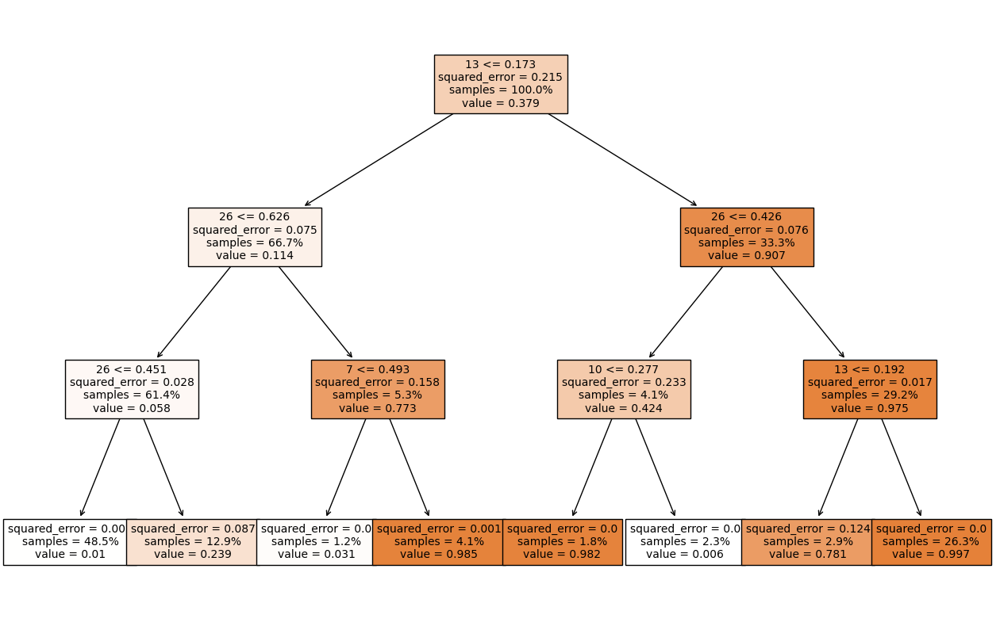

In [63]:
baseSurrogate.plot()

In [64]:
smallSurrogate = smallExp.model_surrogate()
smallSurrogate.performance

6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 1ms/step


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names



,mse,rmse,r2,mae,mad
DecisionTreeRegressor,0.012717,0.112769,0.939927,0.049284,0.009168


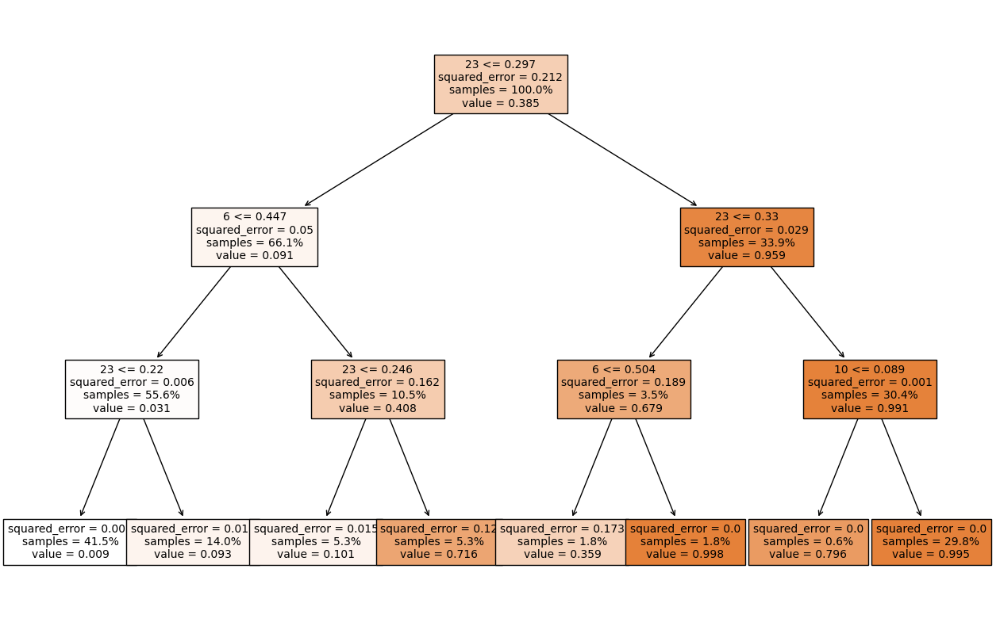

In [65]:
smallSurrogate.plot()

In [66]:
big5Surrogate = big5Exp.model_surrogate()
big5Surrogate.performance

6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names



,mse,rmse,r2,mae,mad
DecisionTreeRegressor,0.020691,0.143844,0.909495,0.05354,0.010632


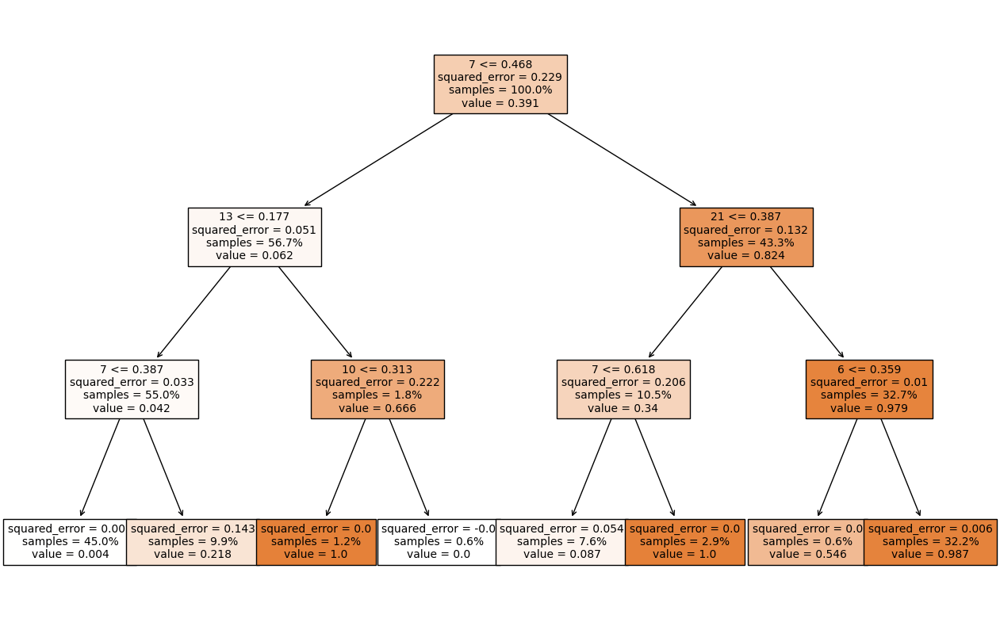

In [67]:
big5Surrogate.plot()

In [68]:
big7Surrogate = big7Exp.model_surrogate()
big7Surrogate.performance

6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 4ms/step


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names



,mse,rmse,r2,mae,mad
DecisionTreeRegressor,0.027519,0.165889,0.882228,0.060003,0.003578


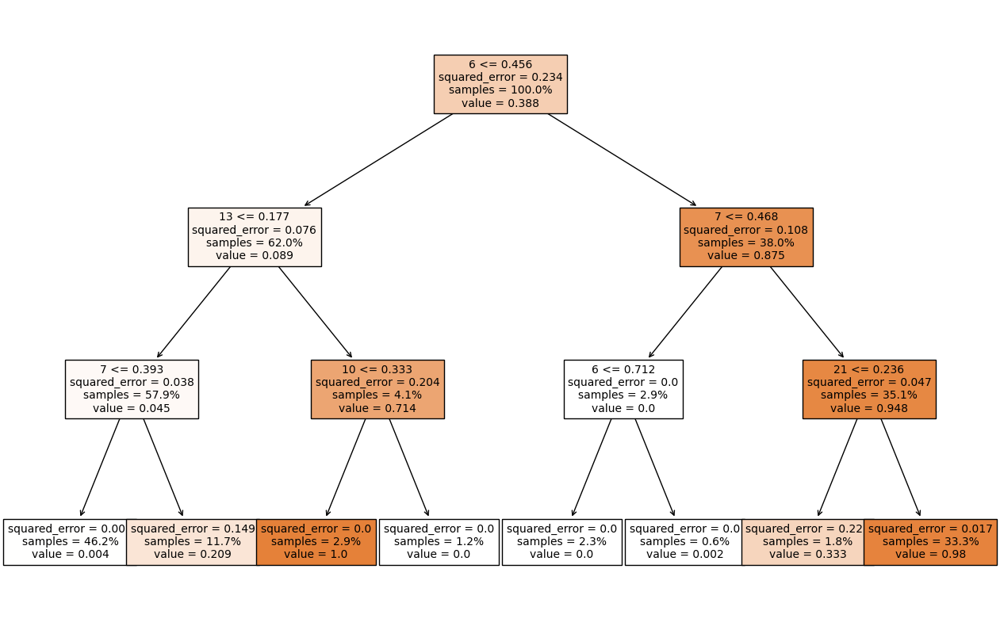

In [69]:
big7Surrogate.plot()

In [70]:
big10Surrogate = big10Exp.model_surrogate()
big10Surrogate.performance

6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names



,mse,rmse,r2,mae,mad
DecisionTreeRegressor,0.025089,0.158394,0.892632,0.053702,0.001169


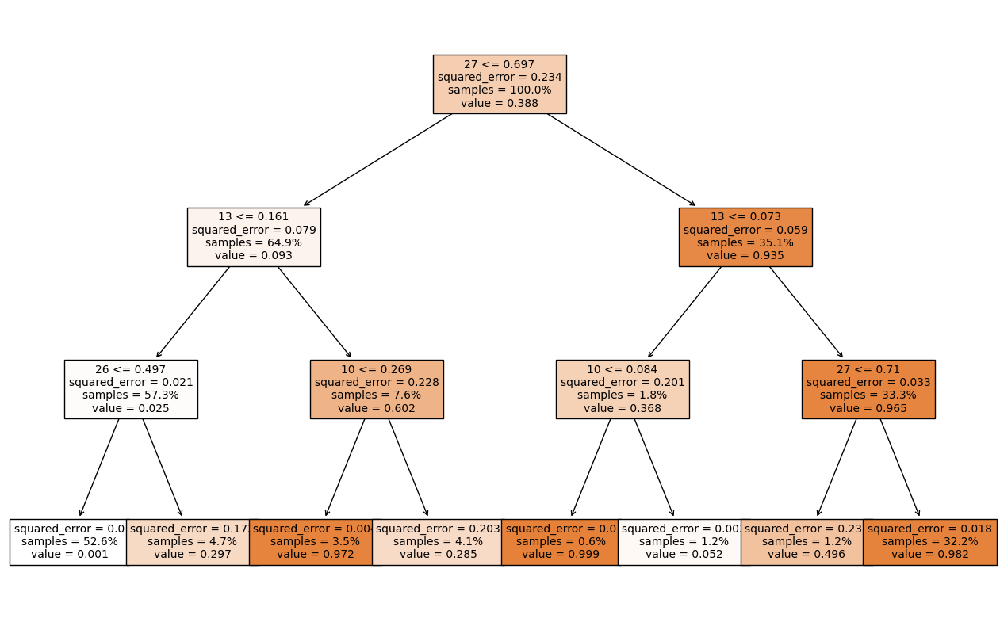

In [71]:
big10Surrogate.plot()

In [72]:
big15Surrogate = big15Exp.model_surrogate()
big15Surrogate.performance

6/6 [==============================] - 0s 8ms/step


6/6 [==============================] - 0s 3ms/step


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names



,mse,rmse,r2,mae,mad
DecisionTreeRegressor,0.016977,0.130295,0.926816,0.037634,0.024601


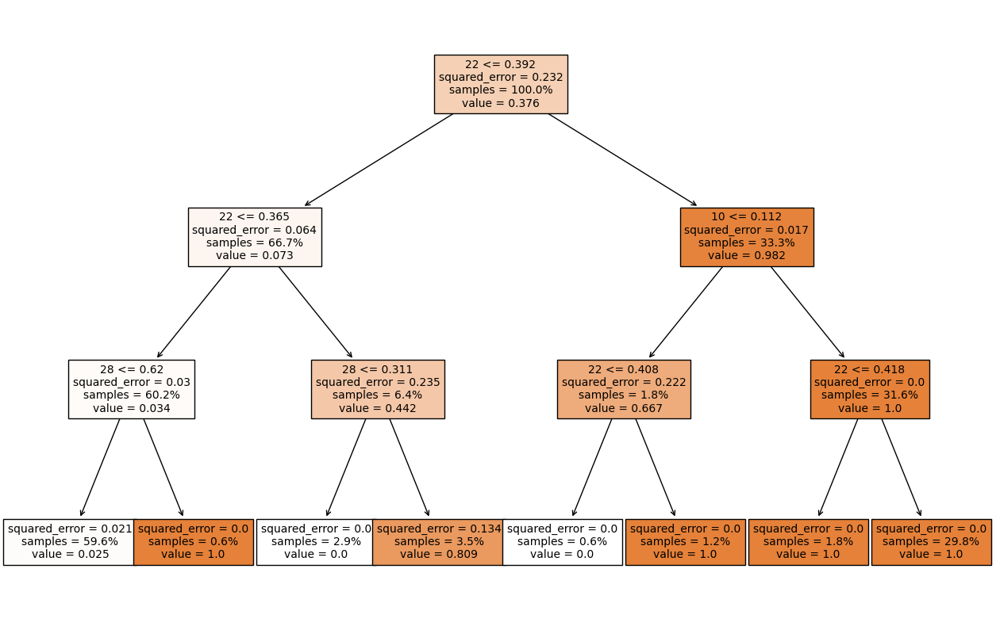

In [73]:
big15Surrogate.plot()